<h1><font size="7">COGS 108 Final Project</font></h1>
</br>
<h2><font size="6">Introduction</font></h2>

<h2><font size="5">Research Question</font></h2>

<p>How do certain geographical regions, clusters of neighboring restaurants, and restaurant type correlate with a restaurant’s rating on Yelp?</p>

<h2><font size="5">Hypothesis</font></h2>
<p>We hypothesize that there will be clusters of highly rated restaurants that can be predicted by neighborhoods, postal codes, and ethnic food categories. Different regions will have different clusters of popular restaurants and unique food trends.</p>


<h2><font size="5">Our Dataset</font></h2>
<p>Number of observations: 175,000
Link to the dataset: https://www.yelp.com/dataset/challenge</p>

<p>We will be working with the Yelp Dataset’s business.json file.</p>


<h2><font size="5">Packages Used</font></h2>

<p>We will use the Pandas package to sort our data into dataframes. Numpy will be used for basic mathematical calculations and array operations. Scipy will be used to analyze the data. Pyplot and seaborn will both be used to graph the data. Copy will be used to make deep copies.</p>

In [1]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import seaborn as sns
import copy as cp
from collections import OrderedDict

In [2]:
# Open df and save categories
df_bus = pd.read_json('./Datasets/yelp_business.json')

In [3]:
df_bus = df_bus.reset_index(drop=True) #this removed the strange row indexing that the data came with

bus_state = df_bus.iloc[:,10] #creates new data frame with only ‘state’ data
bus_state = bus_state.reset_index(drop = True) #row indexing now fixed 
#bus_state.unique()
#bus_state.value_counts()
#bus_state[bus_state == 'C']  #return all data points that match label of C 

df_bus = df_bus.drop(['business_id'],axis=1) #removes business_id
df_bus

,address,attributes,categories,city,is_open,name,postal_code,review_count,stars,state
0,"4855 E Warner Rd, Ste B9","{'AcceptsInsurance': True, 'ByAppointmentOnly'...","[Dentists, General Dentistry, Health & Medical...",Ahwatukee,1,Dental by Design,85044,22,4.0,AZ
1,3101 Washington Rd,"{'BusinessParking': {'garage': False, 'street'...","[Hair Stylists, Hair Salons, Men's Hair Salons...",McMurray,1,Stephen Szabo Salon,15317,11,3.0,PA
2,737 West Pike St,"{'RestaurantsTableService': True, 'GoodForMeal...","[Breakfast & Brunch, Gluten-Free, Coffee & Tea...",Houston,0,East Coast Coffee,15342,3,4.5,PA
3,308 Concord Pkwy N,{},"[Pets, Veterinarians]",Concord,1,Concord Parkway Animal Hospital,28027,3,3.0,NC
4,,"{'BusinessAcceptsCreditCards': True, 'ByAppoin...","[Beauty & Spas, Makeup Artists]",Las Vegas,1,Makeup by Rose C,89129,7,5.0,NV
5,,"{'BusinessParking': {'garage': False, 'street'...","[Tanning, Beauty & Spas, Spray Tanning, Perman...",Scottsdale,1,Eye Envy,85054,4,4.0,AZ
6,"7322 S Rainbow Blvd, Ste 102-172","{'BusinessAcceptsCreditCards': True, 'ByAppoin...","[Shopping, Pool & Hot Tub Service, Landscaping...",Las Vegas,1,Future Yards of Las Vegas,89119,10,4.5,NV
7,4003 Warrensville Center Rd,{},"[Pets, Pet Services, Pet Sitting, Veterinarians]",Beachwood,1,Warrensville Animal Hospital,44122,5,4.0,OH
8,4819 E Ray Rd,"{'BusinessAcceptsCreditCards': True, 'Restaura...","[Shopping, Office Equipment]",Phoenix,1,Officemax,85044,3,3.0,AZ
9,206 Federal St,"{'BusinessAcceptsCreditCards': True, 'Restaura...","[Shopping, Fashion, Sports Wear, Sporting Goods]",Pittsburgh,1,The Pittsburgh Fan,15212,5,3.0,PA


<h2><font size="6">Data Cleaning</font></h2>

<p>Before we analyze the data, we will need to clean it to suit our needs. We will clean the data in the following ways:</p>

* Focus on food businesses
    * Find business categories related to food
    * Find ethnic food categories
    * Remove business categories unrelated to food
* Hone in on region
    * Reduce scope to North America
* Remove underrepresented data
    * Remove underrepresented business categories (such categories with one entry)
    * Remove cities with not enough businesses to include

In [4]:
# Drop everything but restaurants
df_bus = df_bus[df_bus['categories'].map(lambda x: 'Restaurants' in x)]

# Extract categories/counts to a dict
cat_dict = {}
for index, value in df_bus['categories'].iteritems():
    for category in value:
        if category in cat_dict: cat_dict[category] += 1
        else: cat_dict[category] = 1
            
# Convert to pandas series and sort by count
cat_s = pd.Series(cat_dict, name='categories')
cat_s.sort_values(ascending=False, inplace=True)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cat_s)

Restaurants                         54618
Food                                10348
Nightlife                            7479
Bars                                 7194
Sandwiches                           6345
Fast Food                            6280
American (Traditional)               6097
Pizza                                6067
Italian                              4662
Burgers                              4558
Breakfast & Brunch                   4497
Mexican                              4105
Chinese                              3987
American (New)                       3979
Cafes                                3039
Coffee & Tea                         2583
Japanese                             2304
Chicken Wings                        2257
Seafood                              2154
Salad                                2070
Event Planning & Services            2039
Sushi Bars                           1943
Delis                                1668
Asian Fusion                      

<h2><font size="5">Regarding City Cutoff</font></h2>

<p>We have determined that cities with a business count less than or equal to the median should be dropped from our data. This is because such cities would have little to offer in regards to understanding relationships between businesses. We used the median as opposed to the mean because the business count is heavily skewed. Thus, we needed to a measurement of central tendency that was not as heavily influenced by the skewed nature of the data.</p>

In [5]:
# Determining criterion for dropping cities data
df_bus_city_count= df_bus.city.groupby(df_bus.city).count().sort_values(ascending=False)

# Drop cities below the median
cities_dicts = set()
for index, value in df_bus_city_count.iteritems():
    if (value > df_bus_city_count.median()):
        cities_dicts.add(index)

# Use df_bus_city_count against df_bus in order to drop unneeded rows
cities_getridof = []
for index, value in df_bus['city'].iteritems():
    if value not in cities_dicts:
        cities_getridof.append(index)

df_bus.drop(cities_getridof, inplace = True)
df_bus

/Users/caseyj/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,address,attributes,categories,city,is_open,name,postal_code,review_count,stars,state
2,737 West Pike St,"{'RestaurantsTableService': True, 'GoodForMeal...","[Breakfast & Brunch, Gluten-Free, Coffee & Tea...",Houston,0,East Coast Coffee,15342,3,4.5,PA
13,361 Rue Bernard O,"{'RestaurantsTableService': True, 'GoodForMeal...","[Restaurants, Breakfast & Brunch, Seafood Mark...",Montréal,1,Le Pier 66,H2V 1T6,16,4.5,QC
15,"Marienplatz 11, Kaiserbau",{'RestaurantsPriceRange2': 1},"[Bistros, Restaurants]",Stuttgart,0,Bistro Treff bei Anna,70180,4,4.5,BW
17,Kurfürstenstr. 9,"{'DogsAllowed': False, 'Alcohol': 'full_bar', ...","[Restaurants, Chinese]",Ludwigsburg,1,Chinarestaurant Kaiser,71636,19,3.0,BW
18,7683 W Ridgewood Dr,"{'RestaurantsTableService': False, 'GoodForMea...","[Restaurants, Mexican, Fast Food]",Parma,1,Chipotle Mexican Grill,44129,20,2.0,OH
19,853 Milner Ave,"{'GoodForMeal': {'dessert': False, 'latenight'...","[Burgers, Restaurants, American (Traditional),...",Scarborough,1,Harvey's Restaurants,M1B 5N6,8,4.0,ON
21,4296 Kent Rd,"{'Alcohol': 'full_bar', 'HasTV': True, 'NoiseL...","[Bars, Burgers, American (Traditional), Fast F...",Stow,1,Applebee's Neighborhood Grill & Bar,44224,10,3.5,OH
23,188 Eglinton Avenue E,"{'RestaurantsTableService': False, 'GoodForMea...","[Middle Eastern, Lebanese, Restaurants, Halal]",Toronto,1,Maybes Restaurant,M4P 2X7,16,3.0,ON
30,2137 Deming Way,"{'RestaurantsTableService': True, 'GoodForMeal...","[Restaurants, Steakhouses]",Middleton,1,Ruth's Chris Steak House,53562,91,3.5,WI
34,"2095 North Dobson Rd, Ste A-6","{'BusinessParking': {'garage': False, 'street'...","[Food, Korean, Coffee & Tea, Shaved Snow, Dess...",Chandler,1,Snowtime,85224,54,5.0,AZ


<h2><font size="5">Regarding Data Scope</font></h2>
<p>We have decided that the scope of our analysis should include all of North America. We made this decision due to the vast amount of data representation in Canada. Dropping Canadian data would severely limit the scope of our analysis in this context.</p>

In [6]:
#Drop all states with string of 3 not in North America
df_bus = df_bus[df_bus['state'].str.len() < 3]
#Drop all instances of states not in North America
non_NA_states = ['NI','3','C','ST','01','30','BY','6','HU','BW','VS','','CS','SL','B']

# Remove non-North-American states
for i in range(0,len(non_NA_states)):
    df_bus = df_bus[df_bus['state'] != non_NA_states[i]]

# Empty list for states to be removed
rem_lst = []

# Iterate over all the states in dataset
for i in range(0, len(df_bus['state'].unique())):
    
    # If the state has 0 businesses associated with it, add it to the removal list
    if (len(df_bus[df_bus['state'] == df_bus['state'].unique()[i]]) == 0):
        rem_lst.append(df_bus['state'].unique()[i])

# Iterate over removal list
for i in range(0, len(rem_lst)):
    
    # Remove empty states
    df_bus = df_bus[df_bus['state'] != rem_lst[i]]

<h2><font size="5">Regarding Ethnic Categories</font></h2>

<p>Due to the diverse nature of ethnic categories, we did not find it feasible to algorithmically find all of the ethnic categories within the data. So we looked through the possible categories by eyeball.</p>

In [7]:
#Open file containing eyeballed ethnic categories (Txt file in ./Datasets)
with open('./Datasets/ethnicCats.txt') as f:
    ethnicCategories = f.readlines()
# Remove whitespace characters
ethnicCategories = [x.strip() for x in ethnicCategories] 

#Get counts of categories that include these ethnic types
ethnicCnts = []
for index, value in cat_s.iteritems():
    if index in ethnicCategories:
        ethnicCnts.append(value)
print(ethnicCnts)


[6097, 4662, 4105, 3987, 3979, 2304, 1658, 1593, 1468, 1368, 1355, 1029, 1004, 1003, 987, 751, 668, 552, 514, 502, 444, 413, 373, 357, 269, 261, 243, 235, 228, 200, 192, 183, 180, 180, 177, 174, 163, 142, 100, 99, 98, 79, 78, 75, 71, 69, 65, 63, 62, 62, 60, 55, 50, 46, 46, 43, 40, 37, 28, 28, 24, 24, 21, 20, 20, 19, 17, 16, 16, 14, 14, 13, 13, 12, 11]


In [8]:
# Standard deviation of ethnic categories
np.std(ethnicCnts)

1174.2246868844518

In [9]:
# Mean of ethnic categories
np.mean(ethnicCnts)

608.10666666666668

<h2><font size="5">Regarding Dropping Ethnic Categories</font></h2>

<p>Since the counts of ethnic categories is skewed, we handled this situation similarly to cities with low business counts: we used the median to determine if a category had too few counts. We drop restaurants that do not include any ethnic categories along with those that are below the median.</p>

In [10]:
# Grab categories with >= median of ethnic category counts
ethnicDict = set()
for index, value in cat_s.iteritems():
    if index in ethnicCategories and value >= np.median(ethnicCnts):
        ethnicDict.add(index)


In [11]:
# Find indices that do not contain the ethnic categories we want
indicesToDrop = []
for index, value in df_bus['categories'].iteritems():
    
    # If this list ends up empty, we must remove this index
    indexCategories = [x for x in value if x in ethnicDict]
    if not indexCategories:
        indicesToDrop.append(index)

# Drop indices found and clean categories to only include ethnic ones
df_bus.drop(indicesToDrop, inplace=True)
df_bus['categories'] = df_bus['categories'].apply(lambda x: list(filter(lambda y: y in ethnicDict, x)))
df_bus

,address,attributes,categories,city,is_open,name,postal_code,review_count,stars,state
18,7683 W Ridgewood Dr,"{'RestaurantsTableService': False, 'GoodForMea...",[Mexican],Parma,1,Chipotle Mexican Grill,44129,20,2.0,OH
19,853 Milner Ave,"{'GoodForMeal': {'dessert': False, 'latenight'...",[American (Traditional)],Scarborough,1,Harvey's Restaurants,M1B 5N6,8,4.0,ON
21,4296 Kent Rd,"{'Alcohol': 'full_bar', 'HasTV': True, 'NoiseL...",[American (Traditional)],Stow,1,Applebee's Neighborhood Grill & Bar,44224,10,3.5,OH
23,188 Eglinton Avenue E,"{'RestaurantsTableService': False, 'GoodForMea...","[Middle Eastern, Lebanese, Halal]",Toronto,1,Maybes Restaurant,M4P 2X7,16,3.0,ON
34,"2095 North Dobson Rd, Ste A-6","{'BusinessParking': {'garage': False, 'street'...",[Korean],Chandler,1,Snowtime,85224,54,5.0,AZ
39,1880 S Alma School Rd,"{'RestaurantsTableService': False, 'GoodForMea...",[Italian],Chandler,1,Barro's Pizza,85224,81,3.5,AZ
50,9375 E Bell Rd,"{'Alcohol': 'full_bar', 'HasTV': True, 'NoiseL...",[American (Traditional)],Scottsdale,1,18 Degrees Neighborhood Grill,85260,77,3.0,AZ
53,1732 Rue Saint-Denis,"{'GoodForMeal': {'dessert': False, 'latenight'...",[Asian Fusion],Montréal,0,Fou d'Asie,H2X 3K6,5,4.0,QC
56,1100 W Royalton Rd,"{'WheelchairAccessible': True, 'Alcohol': 'ful...",[American (Traditional)],Broadview Heights,1,The Dark Room,44147,8,4.0,OH
59,"953 E Sahara Ave, Ste E-33","{'RestaurantsTableService': True, 'GoodForMeal...",[Korean],Las Vegas,0,Myung Sung,89104,24,4.0,NV


<h2><font size="6">Data Analysis and Visualization</font></h2>

<p>Now that our data has been cleaned to have substantially representative business data, and is focused on food businesses with ethnic categories, we can analyze the data.</p>

<p>We will analyze our data to answer the following questions:</p>

* How do ethnic food categories correlate with ratings?
* How does this relationship apply to certain geographical locations? Are some ethnic foods more popular in some areas than others?
    * How does this apply in terms of a "zoomed-in" view (using zip codes and cities)?
    * How does this apply in terms of a "zoomed-out" view (using states)?

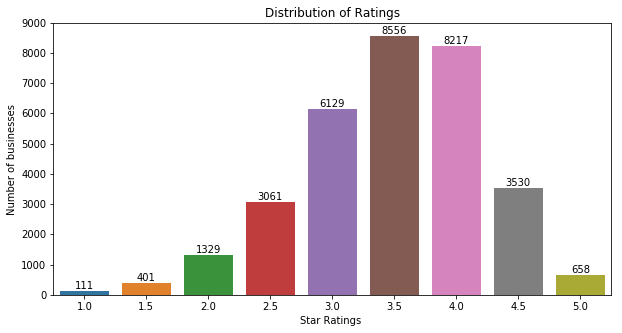

In [12]:
#gets the count of all cities
df_bus.city.groupby(df_bus.city).count().sort_values()

star_count = df_bus['stars'].value_counts()
star_count = star_count.sort_index()

#starts the plotting
plt.figure(figsize=(10,5))
ax= sns.barplot(star_count.index, star_count.values)
plt.title("Distribution of Ratings")
plt.ylabel('Number of businesses', fontsize=10)
plt.xlabel('Star Ratings ', fontsize=10)

#adding the text labels
rects = ax.patches
labels = star_count.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [13]:
df_bus = df_bus.reset_index(drop=True) #this removed the strange row indexing that the data came with

# Define a dictionary to compile ratings respective to ethic categories
ethnicRatings = dict()

# Create an empty list for all the ethnic categories
for i in range(0,len(ethnicCategories)):
    ethnicRatings[ethnicCategories[i]] = []

# Iterate over all category lists
for i in range(0,len(df_bus['categories'])):

    # Iterate over lists of categories
    for j in range(0,len(df_bus['categories'][i])):
        
        # If a category of a list is in ethnicCats, update ratings for that ethnic category
        if (df_bus['categories'][i][j] in ethnicCategories):
            ethnicRatings[df_bus['categories'][i][j]].append(df_bus['stars'][i])

# List for removing keys with empty lists for values
rem_emp = []
    
# Iterate over dictionary
for key in ethnicRatings:
    if not ethnicRatings[key]:
        rem_emp.append(key)
    
# Remove from removal list
for i in range (0, len(rem_emp)):
    ethnicRatings.pop(rem_emp[i])


In [14]:
# Define dictionary for average ethnic ratings
avgEthnicRatings = dict()

# Get average ratings for all ethnic restaurants
for key in ethnicRatings:
    avgEthnicRatings[key] = np.mean(ethnicRatings[key])

# List for removing nan values
rem_nan = []

# Iterate over dictionary
for key in avgEthnicRatings:
    if np.isnan(avgEthnicRatings[key]):
        rem_nan.append(key)
    
# Remove from removal list
for i in range (0, len(rem_nan)):
    avgEthnicRatings.pop(rem_nan[i])
    
# Sort dictionary into alphabetical order
avgEthnicRatings = OrderedDict(sorted(avgEthnicRatings.items(), key=lambda x: x[0]))

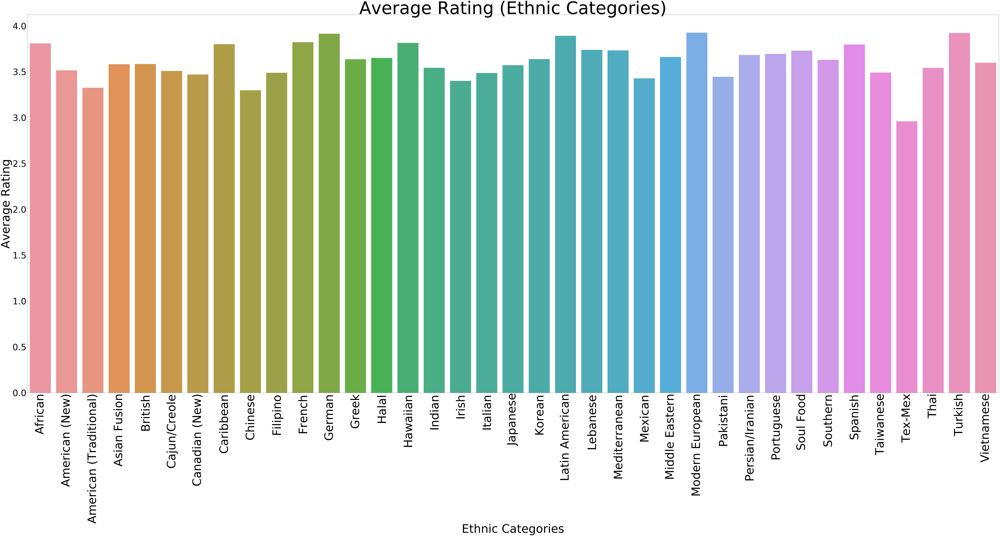

In [16]:
# Obtain a list of respective values
avgEtnX = list(avgEthnicRatings.keys())
avgEtnY = list(avgEthnicRatings.values())

# Create the bar plot with predetermined size
plt.figure(figsize=(150,60))
ax= sns.barplot(avgEtnX,avgEtnY)

# Labeling
plt.title("Average Rating (Ethnic Categories)",fontsize=150)
plt.ylabel('Average Rating', fontsize=100)
plt.xlabel('Ethnic Categories', fontsize=100)
plt.setp(ax.get_xticklabels(), rotation='vertical', fontsize=100)
plt.setp(ax.get_yticklabels(), fontsize=75)

plt.show()

In [17]:
# Returns numpy matrix: rows=zip codes, columns=categories; both in ascending order
def getStateCategories(state):

    # Dataframe for specific state and return matrix
    df_state = df_bus.loc[df_bus['state'] == state]
    stateCategories = []
    
    # Iterate over unique zip codes, making a list of tuple(category, count) for each
    stateZips = sorted(list(df_state['postal_code'].unique()))
    for zipCode in stateZips:
        zip_series = df_state.loc[df_state['postal_code'] == zipCode]['categories']
        zipDict = OrderedDict(sorted([(x, 0) for x in list(ethnicDict)], key=lambda t: t[0]))
        
        # Iterate through each category list for the specific zip code
        for i, categories in zip_series.iteritems():
            for cats in categories:
                zipDict[cats] += 1
        
        # Add the list to the overall state list
        stateCategories.append(list(zipDict.values()))
    
    return np.matrix(stateCategories)

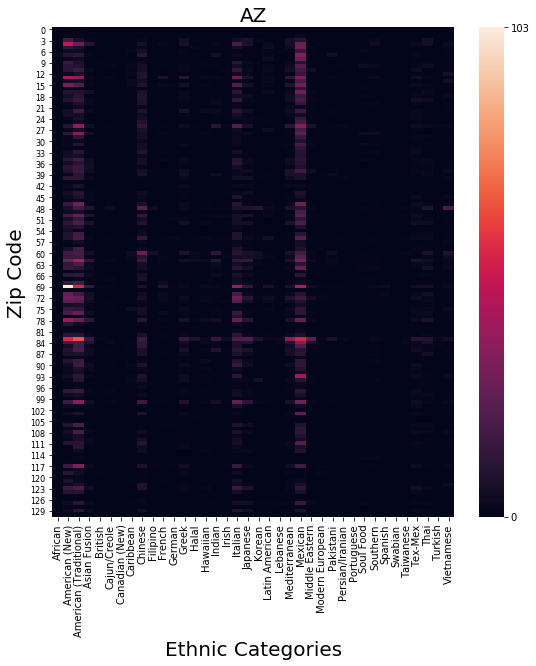

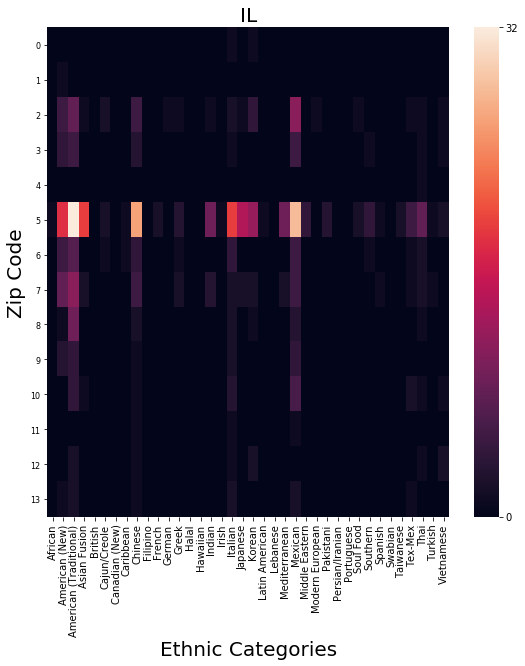

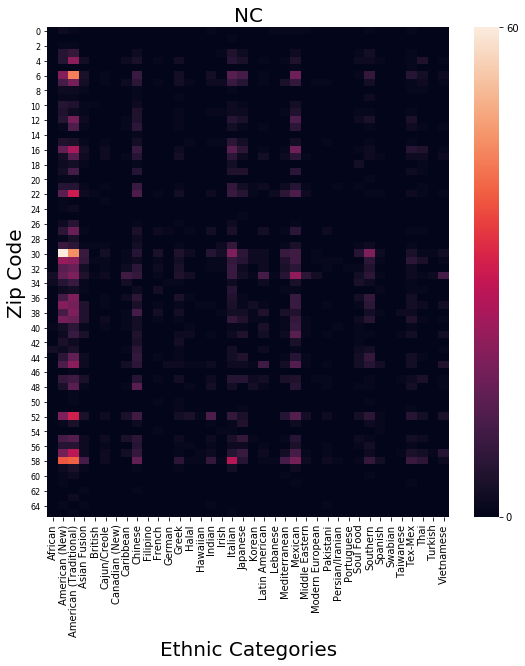

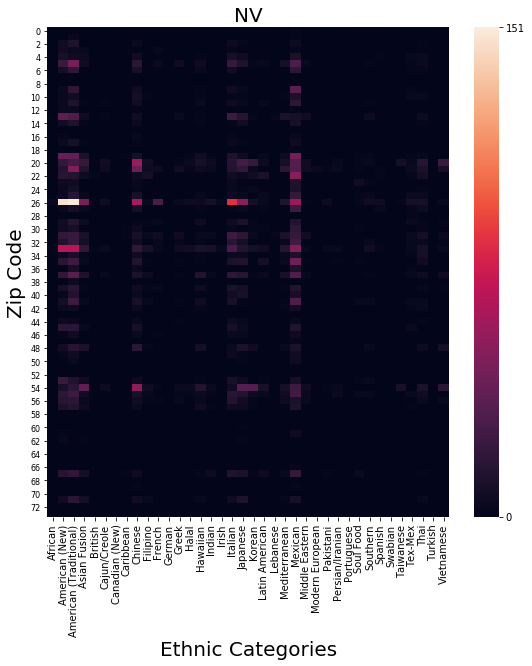

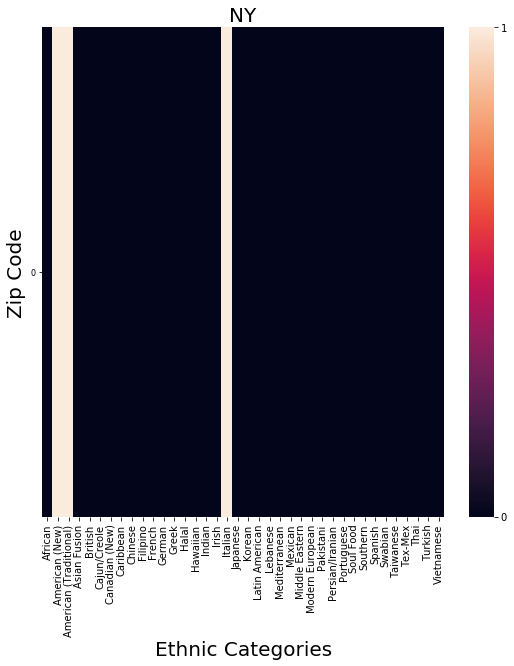

...

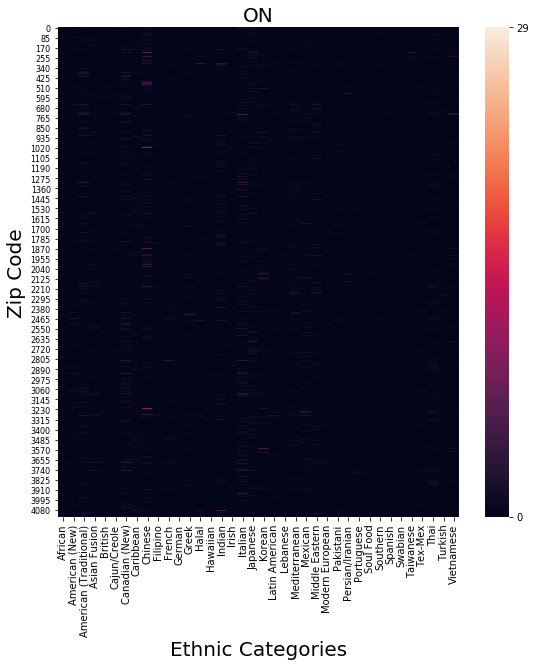

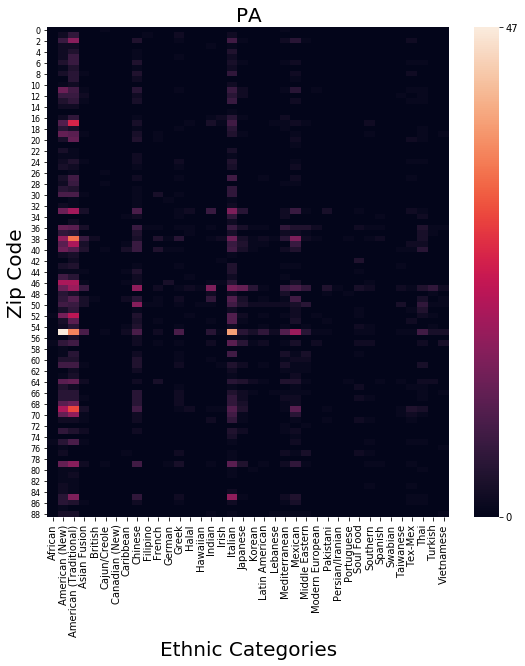

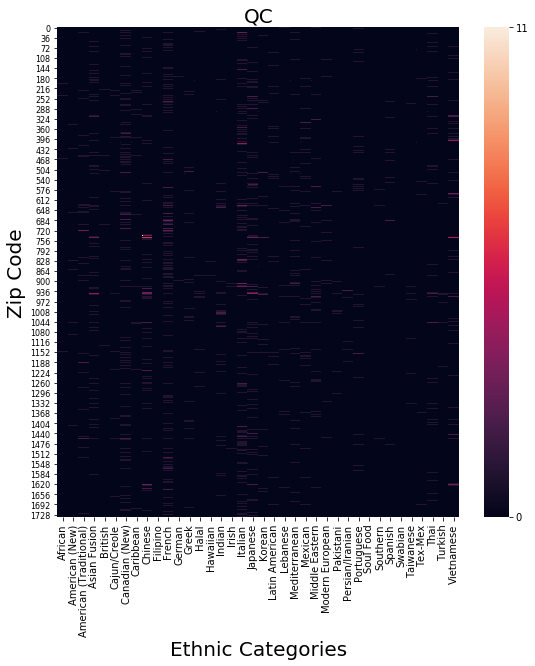

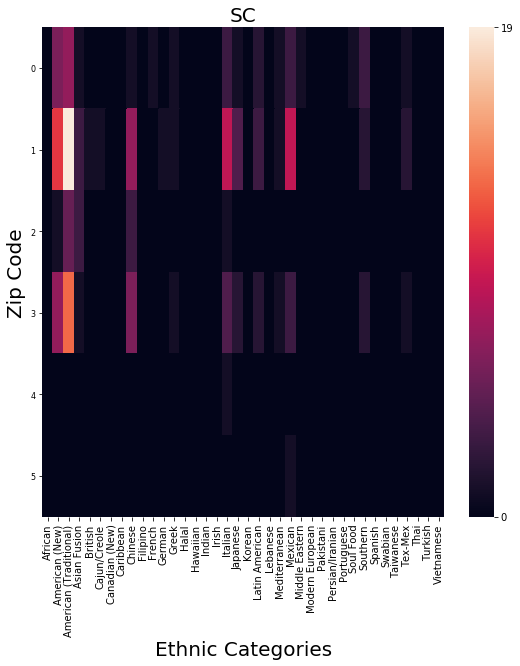

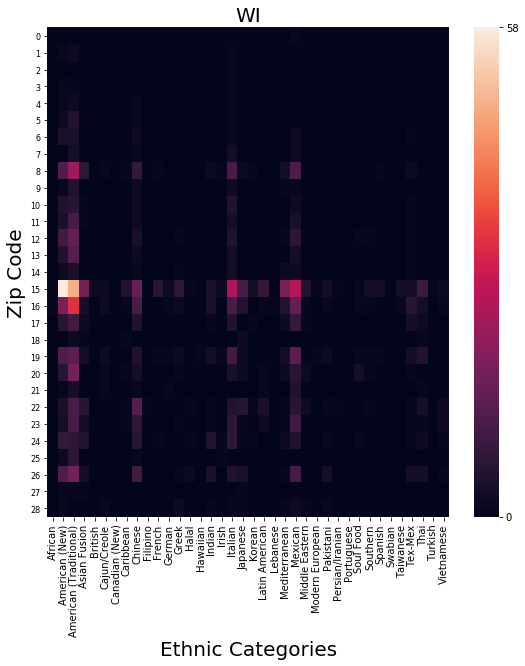

In [18]:
# Loop through each state and print their heatmap
for state in sorted(df_bus['state'].unique()):
    mat = getStateCategories(state)
    #ylabels = sorted(list(df_bus.loc[df_bus['state'] == state]['postal_code'].unique())); yticklabels=ylabels ????
    plt.figure(figsize=(9,9))
    ax = sns.heatmap(data=mat,xticklabels=sorted(list(ethnicDict)),cbar_kws={'ticks':[0,mat.max()]})
    plt.title(state,fontsize=20)
    plt.ylabel('Zip Code', fontsize=20)
    plt.xlabel('Ethnic Categories', fontsize=20)
    plt.setp(ax.get_xticklabels(), rotation='vertical', fontsize=10)
    plt.setp(ax.get_yticklabels(), rotation='horizontal', fontsize=8)
    plt.show()

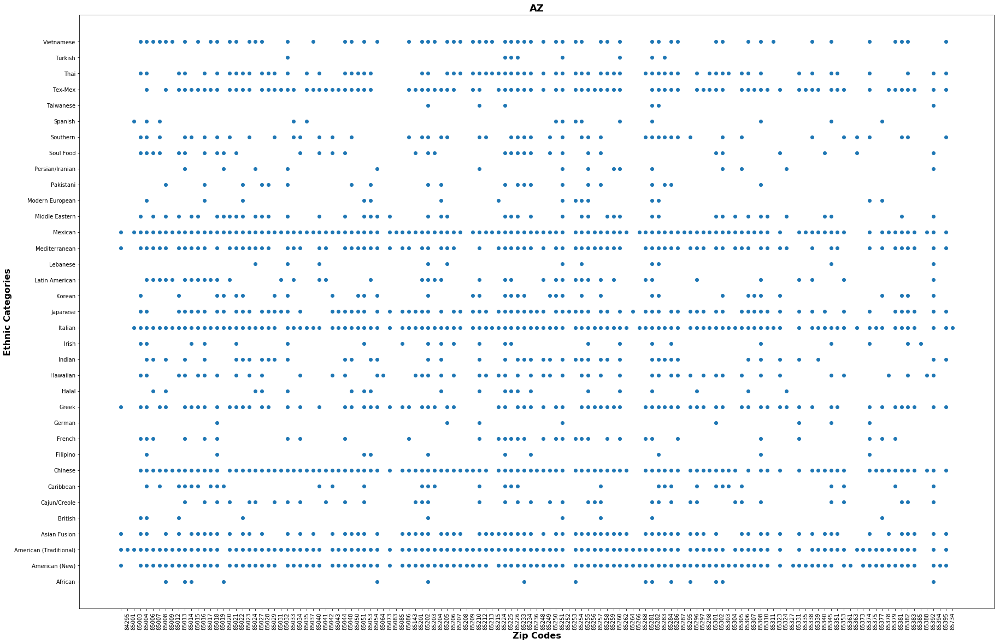

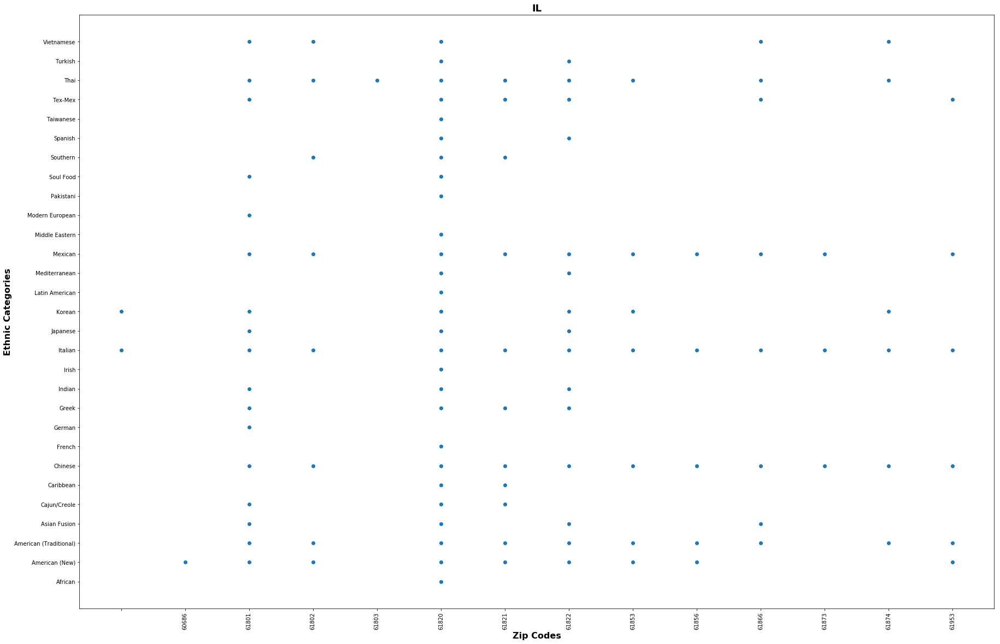

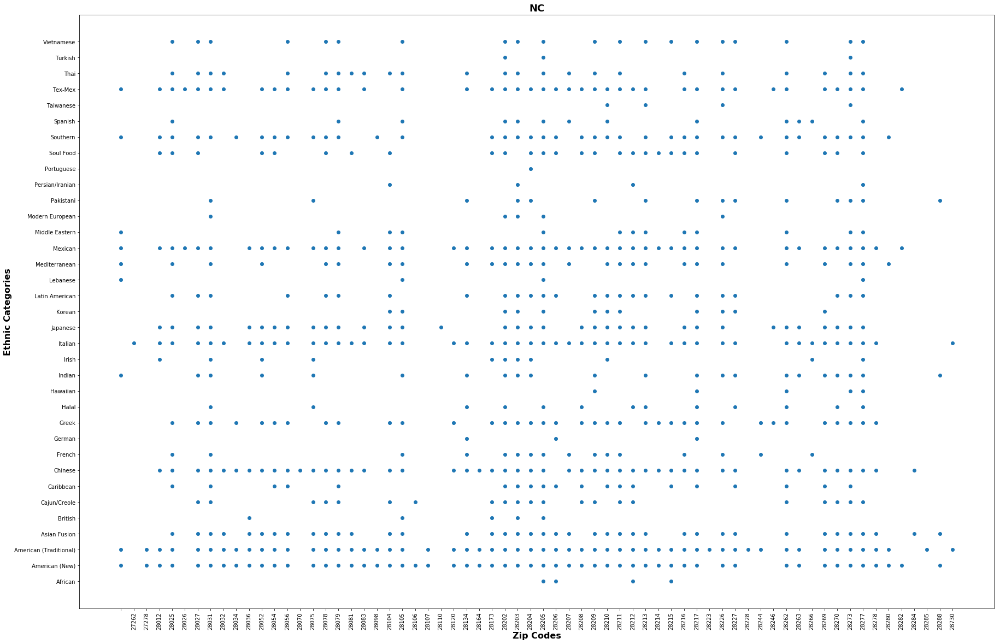

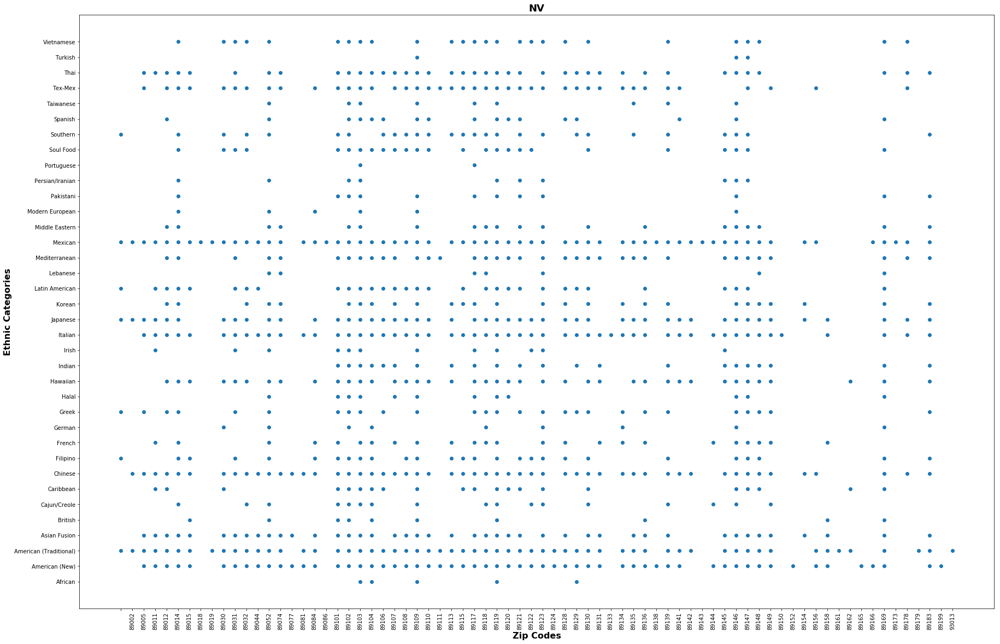

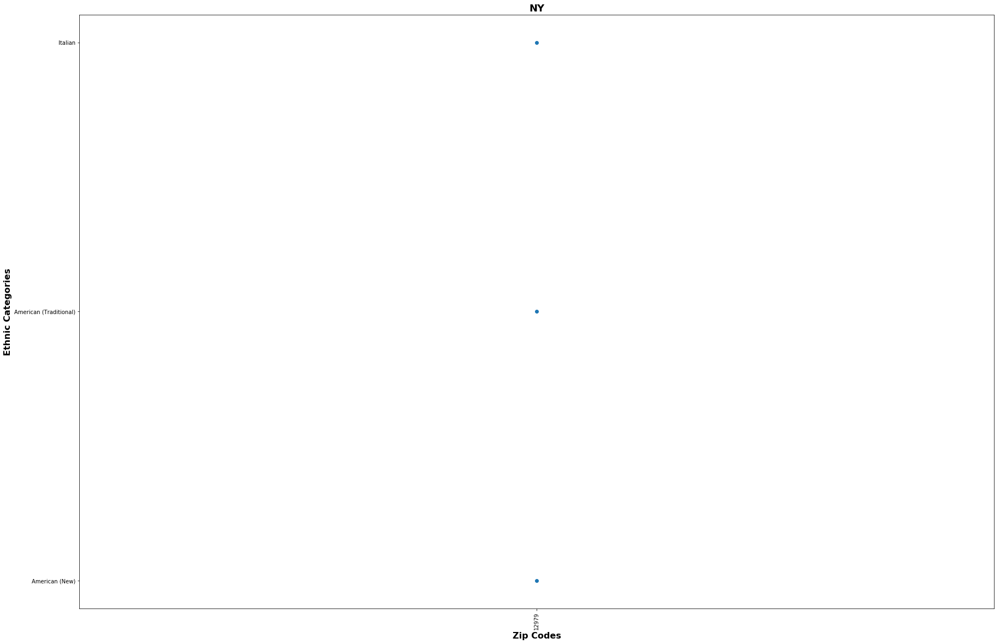

...

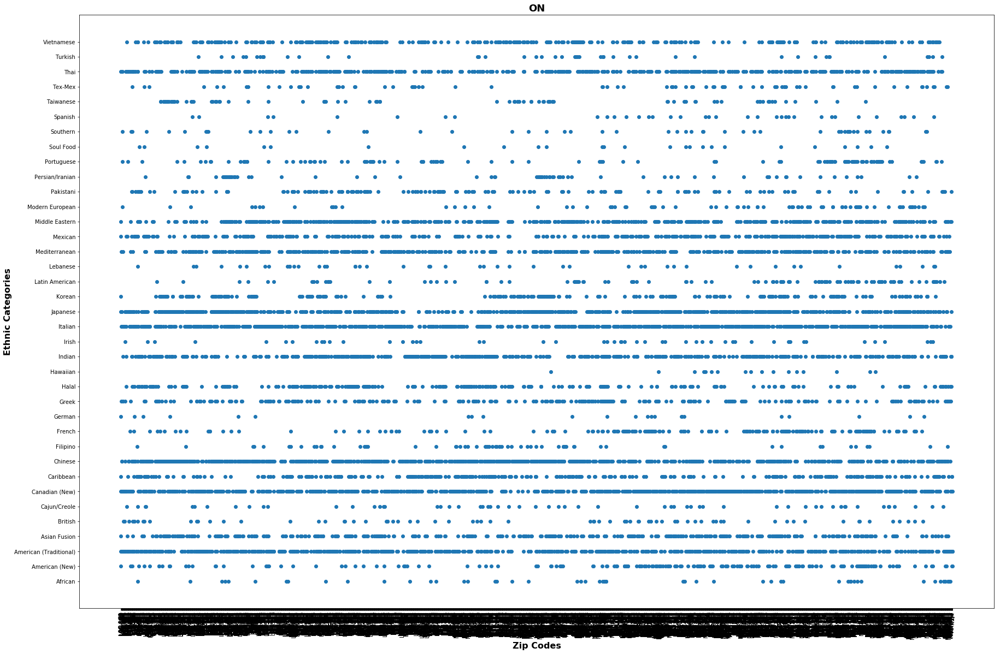

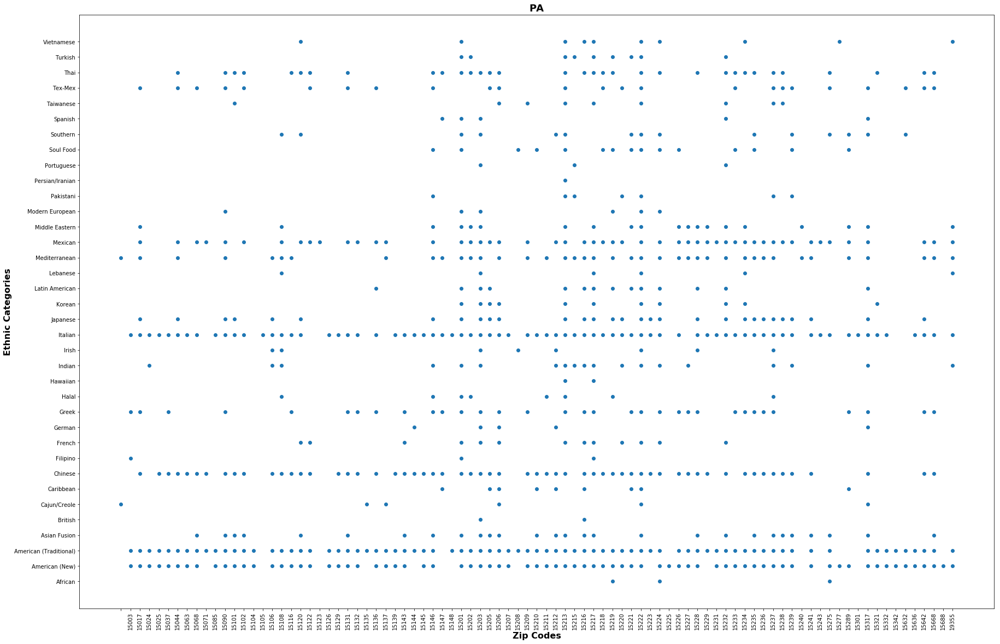

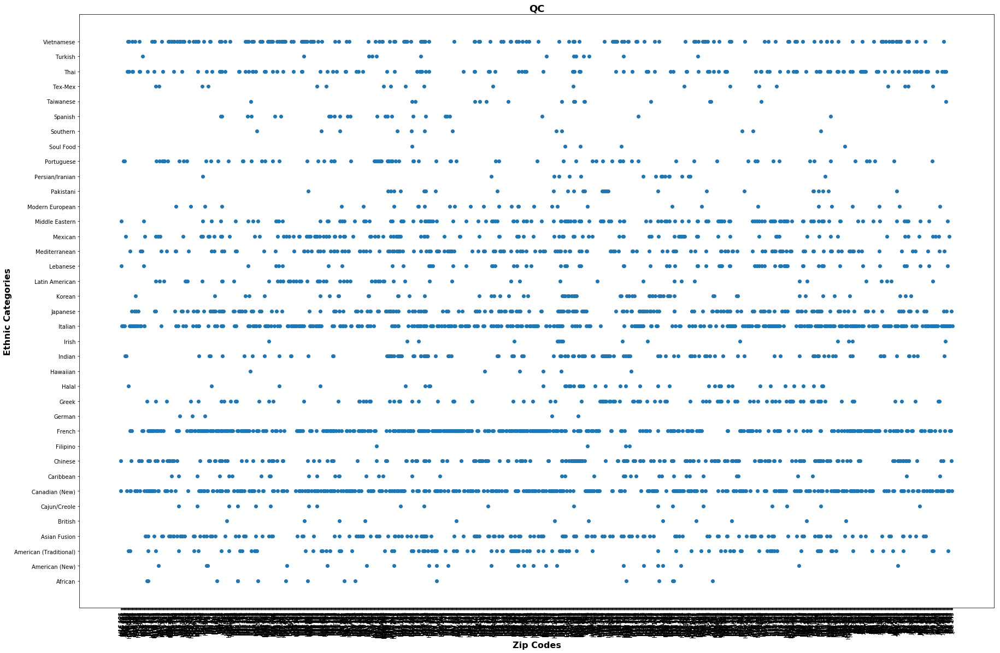

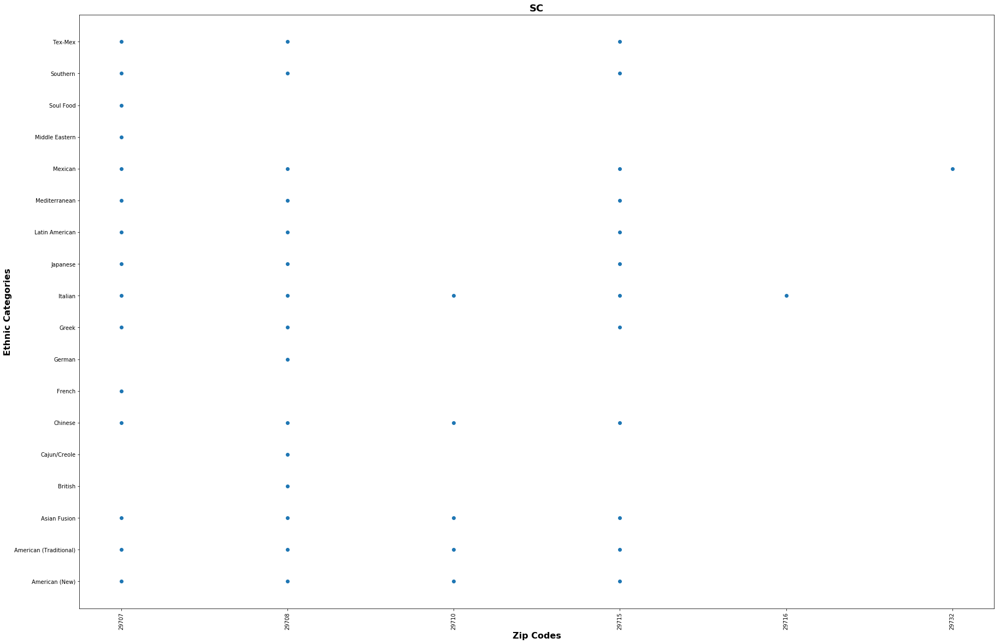

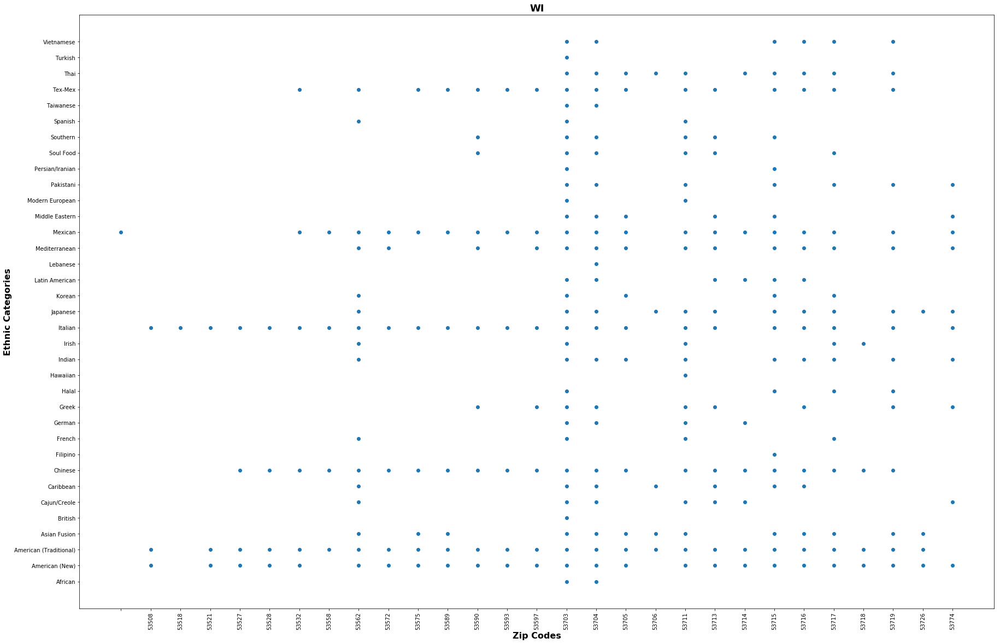

In [17]:
# Loop through unique states and print their scatterplot
for state in sorted(df_bus['state'].unique()):
    stateCategories = getStateCategories(state)

    # Format scatterplot
    plt.figure(figsize=(30,20))
    plt.scatter(*zip(*stateCategories))
    plt.title(state, fontsize=18, fontweight='bold')
    plt.xlabel('Zip Codes', fontsize=16, fontweight='bold')
    plt.ylabel('Ethnic Categories', fontsize=16, fontweight='bold')
    plt.xticks(rotation=90)
    plt.show()

In [18]:
# A dictionary for keeping track of ratings within a single city.
# NOTE: This dictionary will be overwritten many times over.
etnCityRats = dict()

# A list to keep track of all the ethnic ratings of each city
allEtnCityRats = []

# Iterate over each city
for city in df_bus['city'].unique():

    # Add in categories
    for i in range(0,len(ethnicCategories)):
        etnCityRats[ethnicCategories[i]] = []
    
    # Create a temporary dataframe to access each city
    df_temp = df_bus[df_bus['city'] == city].reset_index(drop=True)
    
    # Iterate over each list of categories
    for i in range(0,len(df_temp['categories'])):
        
        # Iterate over each category
        for j in range(0,len(df_temp['categories'][i])):
            
            # If this category from the list is in the ethnic cats, update ratings
            if (df_temp['categories'][i][j] in ethnicCategories):
                etnCityRats[df_temp['categories'][i][j]].append(df_temp['stars'][i])
               
    # Add ratings to the master list
    allEtnCityRats.append(etnCityRats)
    
    # Wipe the dictionary for the next city
    etnCityRats = dict()

In [19]:
# Create a list with the average ratings for each ethnic cat for each city
avgAllEtnCityRats = cp.deepcopy(allEtnCityRats)

# Iterate over each city
for i in range (0,len(avgAllEtnCityRats)):
    
    # Iterate over each ethnic category
    for item in avgAllEtnCityRats[i]:
        
        # Take the average of the ratings for said category
        mean = np.mean(avgAllEtnCityRats[i][item])
        
        # Apply average, if possible
        avgAllEtnCityRats[i][item] = np.mean(avgAllEtnCityRats[i][item])
        
# Create a dataframe of average ratings for ethnic categories over cities
df_avgCityRats = pd.DataFrame(data=avgAllEtnCityRats,index=df_bus['city'].unique())
df_avgCityRats = df_avgCityRats.fillna(value=0)
df_avgCityRats

/Users/caseyj/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/caseyj/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Afghan,African,American (New),American (Traditional),Arabian,Argentine,Asian Fusion,Austrian,Bangladeshi,Bavarian,...,Spanish,Sri Lankan,Swabian,Taiwanese,Tex-Mex,Thai,Turkish,Ukrainian,Venezuelan,Vietnamese
Parma,0.0,0.000000,3.500000,3.214286,0.0,0.0,4.250000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,2.625000,4.000000,0.000000,0.0,0.0,4.000000
Scarborough,0.0,4.500000,3.500000,2.888889,0.0,0.0,3.250000,0.0,0.0,0.0,...,0.000000,0.0,0.0,3.100000,0.000000,3.142857,3.000000,0.0,0.0,3.200000
Stow,0.0,0.000000,3.000000,2.966667,0.0,0.0,4.500000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,3.000000,4.000000,0.000000,0.0,0.0,0.000000
Toronto,0.0,3.857143,3.421212,3.149231,0.0,0.0,3.450943,0.0,0.0,0.0,...,3.740741,0.0,0.0,3.291667,3.081395,3.236364,4.027778,0.0,0.0,3.505405
Chandler,0.0,0.000000,3.481250,3.427885,0.0,0.0,3.611111,0.0,0.0,0.0,...,0.000000,0.0,0.0,3.750000,3.090909,3.809524,4.166667,0.0,0.0,3.921053
Scottsdale,0.0,3.750000,3.718531,3.586667,0.0,0.0,3.625000,0.0,0.0,0.0,...,3.666667,0.0,0.0,0.000000,3.260000,3.851852,4.000000,0.0,0.0,3.900000
Montréal,0.0,3.769231,3.552632,3.487342,0.0,0.0,3.644531,0.0,0.0,0.0,...,4.000000,0.0,0.0,3.692308,3.423077,3.333333,3.750000,0.0,0.0,3.652318
Broadview Heights,0.0,0.000000,3.125000,3.375000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000
Las Vegas,0.0,3.888889,3.612369,3.390827,0.0,0.0,3.859848,0.0,0.0,0.0,...,3.840000,0.0,0.0,3.680000,3.000000,3.824324,3.500000,0.0,0.0,3.635870
Mississauga,0.0,3.625000,2.550000,3.230000,0.0,0.0,3.240385,0.0,0.0,0.0,...,4.000000,0.0,0.0,3.285714,3.277778,3.127273,3.500000,0.0,0.0,3.536364


In [20]:
# A dictionary for keeping track of ratings within a single state.
# NOTE: This dictionary will be overwritten many times over.
etnStateRats = dict()

# A list to keep track of all the ethnic ratings of each State
allEtnStateRats = []

# Iterate over each State
for state in df_bus['state'].unique():

    # Add in categories
    for i in range(0,len(ethnicCategories)):
        etnStateRats[ethnicCategories[i]] = []
    
    # Create a temporary dataframe to access each State
    df_temp = df_bus[df_bus['state'] == state].reset_index(drop=True)
    
    # Iterate over each list of categories
    for i in range(0,len(df_temp['categories'])):
        
        # Iterate over each category
        for j in range(0,len(df_temp['categories'][i])):
            
            # If this category from the list is in the ethnic cats, update ratings
            if (df_temp['categories'][i][j] in ethnicCategories):
                etnStateRats[df_temp['categories'][i][j]].append(df_temp['stars'][i])
               
    # Add ratings to the master list
    allEtnStateRats.append(etnStateRats)
    
    # Wipe the dictionary for the next State
    etnStateRats = dict()

In [21]:
# Create a list with the average ratings for each ethnic cat for each city
avgAllEtnStateRats = cp.deepcopy(allEtnStateRats)

# Iterate over each city
for i in range (0,len(avgAllEtnStateRats)):
    
    # Iterate over each ethnic category
    for item in avgAllEtnStateRats[i]:
        
        # Take the average of the ratings for said category
        mean = np.mean(avgAllEtnStateRats[i][item])
        
        # Apply average, if possible
        avgAllEtnStateRats[i][item] = np.mean(avgAllEtnStateRats[i][item])
        
# Create a dataframe of average ratings for ethnic categories over cities
df_avgStateRats = pd.DataFrame(data=avgAllEtnStateRats,index=df_bus['state'].unique())
df_avgStateRats = df_avgStateRats.fillna(value=0)
df_avgStateRats

/Users/caseyj/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/caseyj/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Afghan,African,American (New),American (Traditional),Arabian,Argentine,Asian Fusion,Austrian,Bangladeshi,Bavarian,...,Spanish,Sri Lankan,Swabian,Taiwanese,Tex-Mex,Thai,Turkish,Ukrainian,Venezuelan,Vietnamese
OH,0.0,4.000000,3.481366,3.306941,0.0,0.0,3.567901,0.0,0.0,0.0,...,4.000000,0.0,0.0,3.750000,2.891892,3.879032,4.250000,0.0,0.0,3.892857
ON,0.0,3.818182,3.297727,3.134228,0.0,0.0,3.386994,0.0,0.0,0.0,...,3.675676,0.0,0.0,3.230769,3.130137,3.275000,3.898148,0.0,0.0,3.434673
AZ,0.0,3.657895,3.576389,3.340147,0.0,0.0,3.597826,0.0,0.0,0.0,...,3.710526,0.0,0.0,3.681818,2.980583,3.842541,3.863636,0.0,0.0,3.805147
QC,0.0,3.875000,3.562500,3.404348,0.0,0.0,3.666667,0.0,0.0,0.0,...,3.980000,0.0,0.0,3.861111,3.275000,3.371324,3.769231,0.0,0.0,3.655941
NV,0.0,3.888889,3.611032,3.402401,0.0,0.0,3.846801,0.0,0.0,0.0,...,3.839286,0.0,0.0,3.692308,2.978261,3.806358,3.500000,0.0,0.0,3.637755
NC,0.0,4.111111,3.444323,3.321267,0.0,0.0,3.601852,0.0,0.0,0.0,...,3.916667,0.0,0.0,4.100000,2.841346,3.833333,3.875000,0.0,0.0,3.852941
IL,0.0,2.500000,3.239130,3.279762,0.0,0.0,3.543478,0.0,0.0,0.0,...,3.250000,0.0,0.0,4.250000,2.681818,3.694444,3.250000,0.0,0.0,3.642857
WI,0.0,3.250000,3.486111,3.398551,0.0,0.0,3.415094,0.0,0.0,0.0,...,3.600000,0.0,0.0,3.875000,2.833333,3.616667,3.500000,0.0,0.0,3.555556
PA,0.0,3.666667,3.479212,3.396523,0.0,0.0,3.619403,0.0,0.0,0.0,...,3.500000,0.0,0.0,3.708333,2.926471,3.821918,4.147059,0.0,0.0,3.600000
SC,0.0,0.000000,3.380000,3.340909,0.0,0.0,3.625000,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.000000,3.000000,0.000000,0.000000,0.0,0.0,0.000000


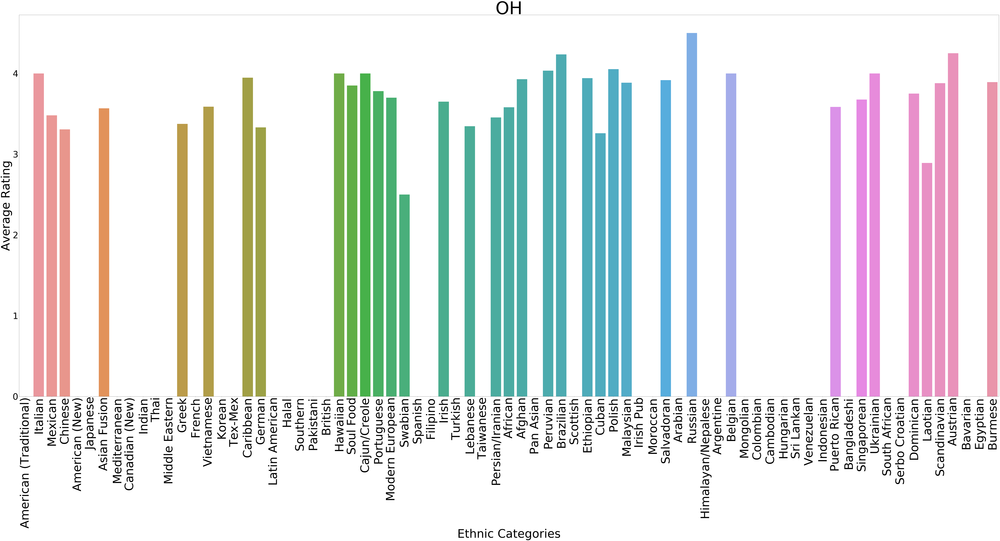

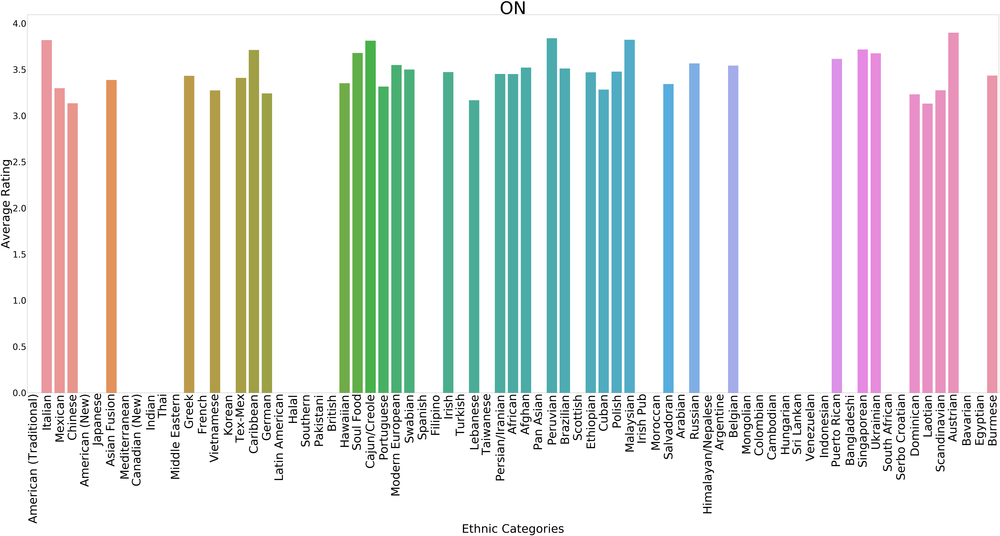

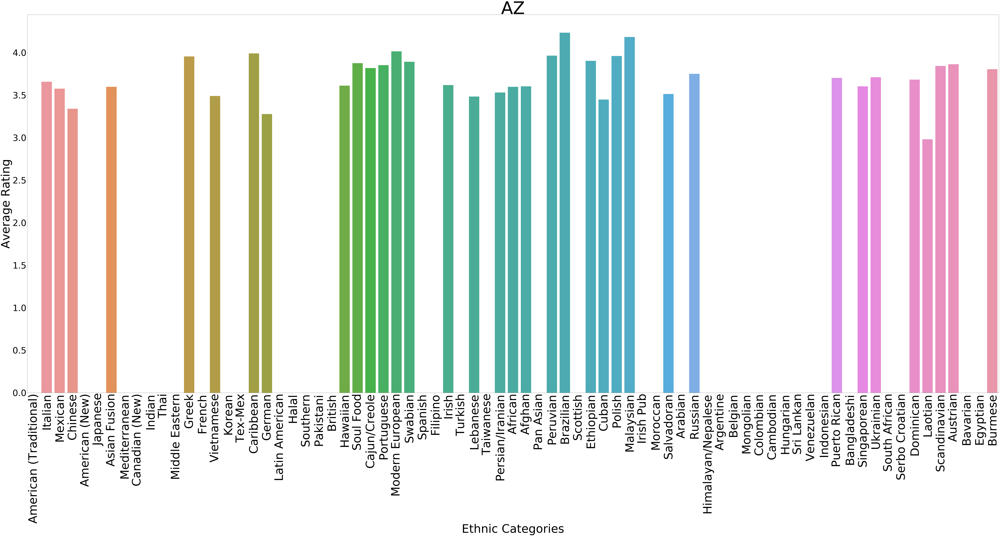

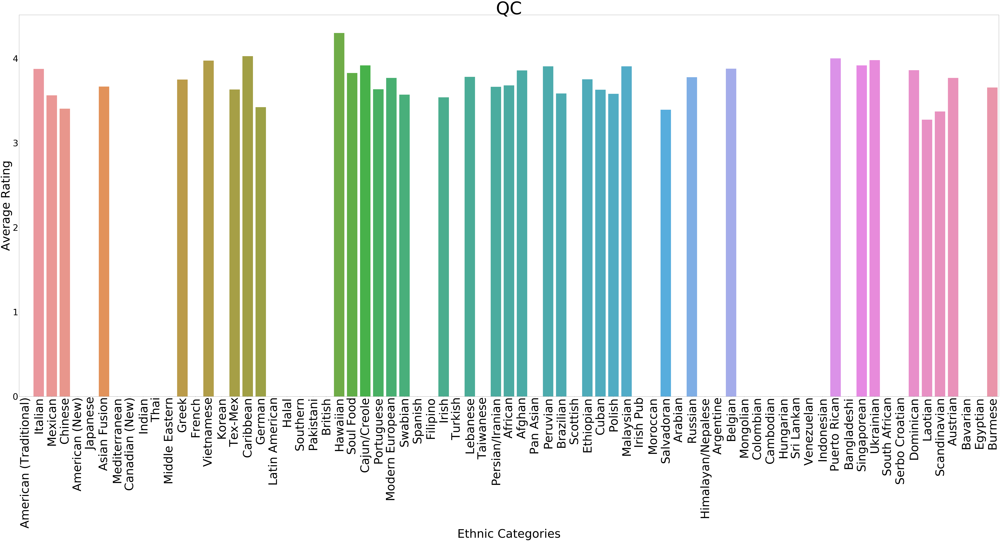

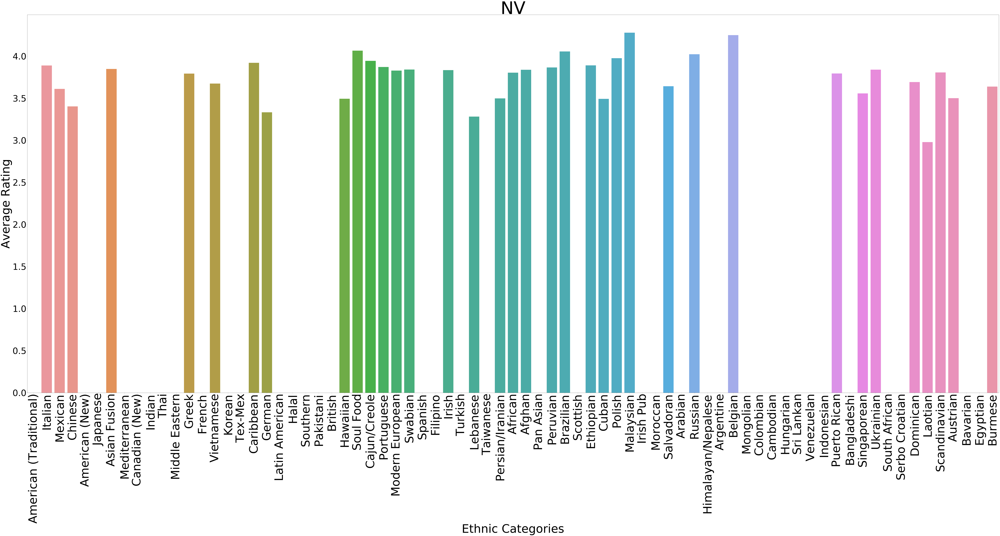

...

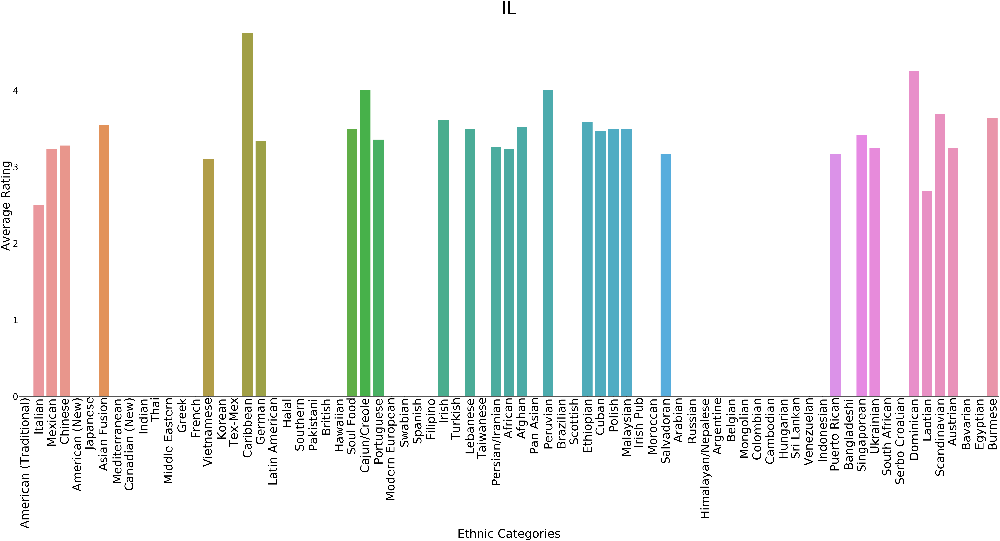

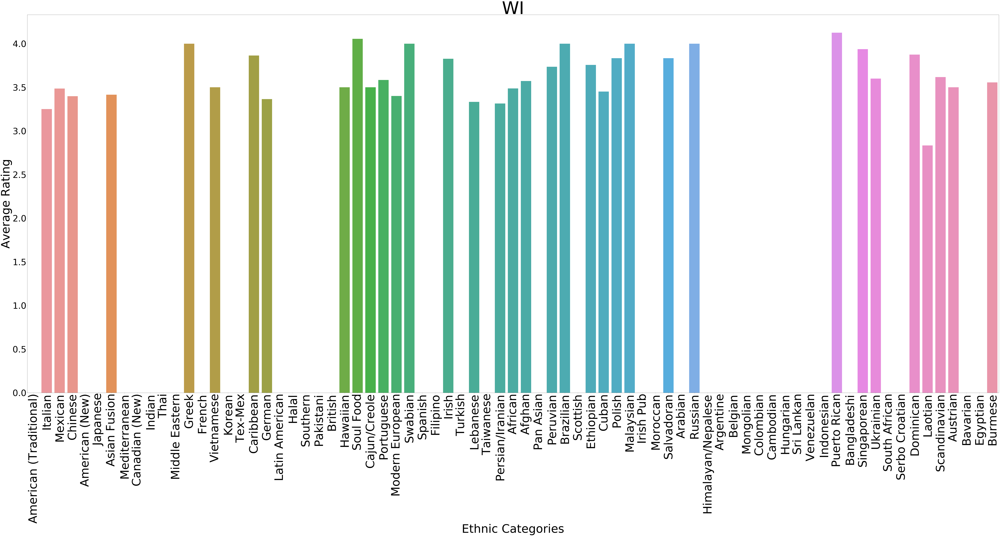

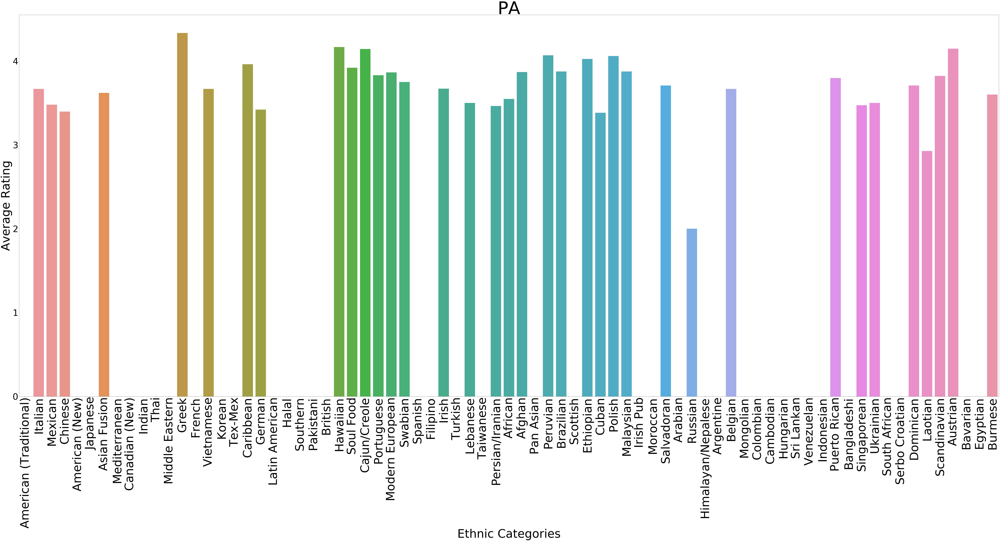

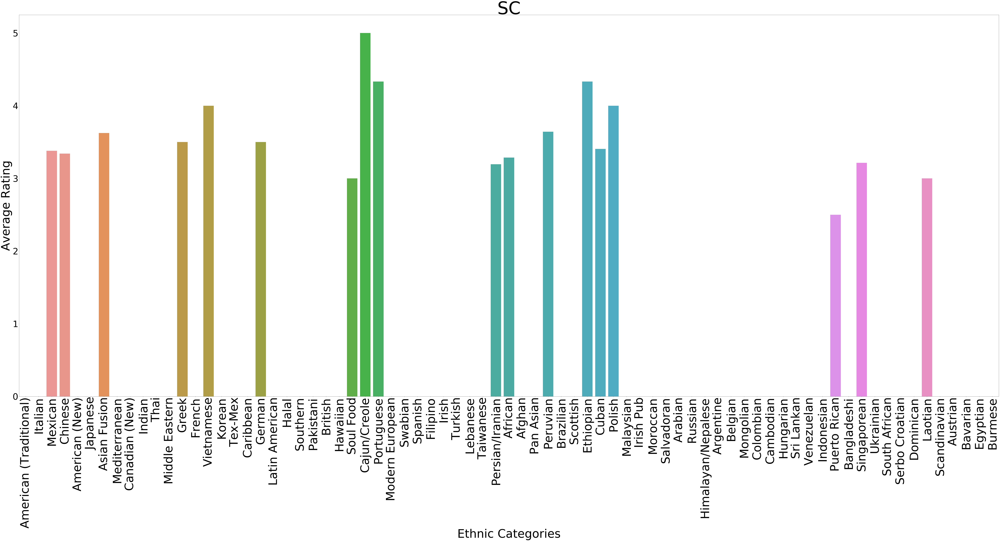

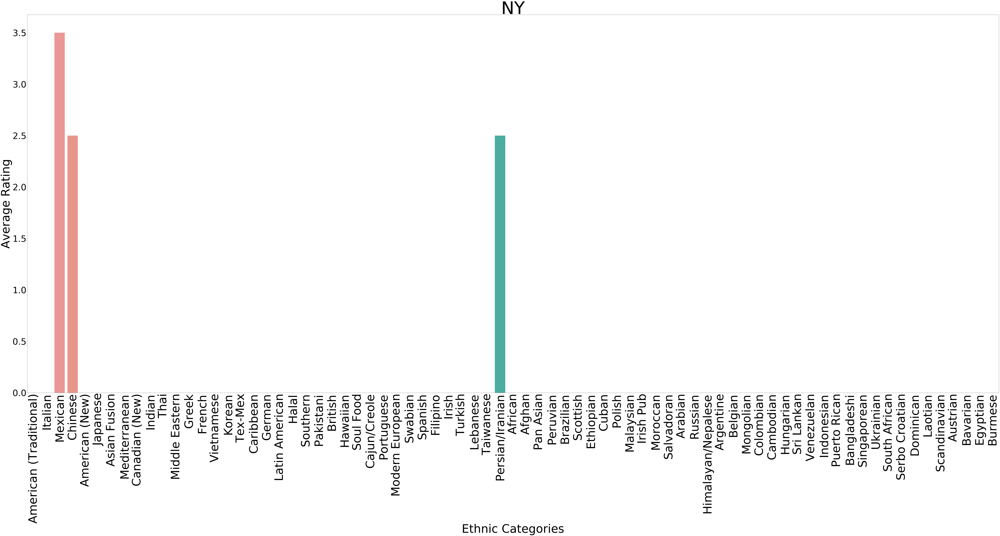

In [22]:
stateList = cp.deepcopy(df_bus['state'].unique())

for state in stateList:    
    # Obtain a list of respective values
    avgStateEtnX = ethnicCategories
    avgStateEtnY = list(df_avgStateRats.loc[state])

    # Create the bar plot with predetermined size
    plt.figure(figsize=(150,60))
    ax= sns.barplot(avgStateEtnX,avgStateEtnY)

    # Labeling
    plt.title(state,fontsize=150)
    plt.ylabel('Average Rating', fontsize=100)
    plt.xlabel('Ethnic Categories', fontsize=100)
    plt.setp(ax.get_xticklabels(), rotation='vertical', fontsize=100)
    plt.setp(ax.get_yticklabels(), fontsize=75)

    plt.show()

<h2><font size="6">Data Predictions</font></h2>

<p>We will also attempt to make prediction models to answer the following questions:</p>

* Can we predict ratings based on what ethnic foods are popular in the area?
* Can we predict this on a "zoomed-in" and "zoomed-out" scale?


<h2><font size="5">Regarding Numeric Mapping</font></h2>

<p>To process our data in the prediction models, we needed to convert cities, states, stars, and postal codes into numbers.</p>

In [23]:
from sklearn import preprocessing
from sklearn import utils

def grabElement(lst):
    return lst[0]

df_bus['categories'] = df_bus['categories'].apply(grabElement)

#This code maps a number to all cities, states, stars, and postal codes
lab_enc = preprocessing.LabelEncoder()
df_bus['city'] = lab_enc.fit_transform(df_bus['city'])
df_bus['state'] = lab_enc.fit_transform(df_bus['state'])
df_bus['stars'] = lab_enc.fit_transform(df_bus['stars'])
df_bus['postal_code'] = lab_enc.fit_transform(df_bus['postal_code'])
df_bus['categories'] = lab_enc.fit_transform(df_bus['categories'])


In [26]:
# Linear Models with sklearn
from sklearn import linear_model
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score
 
X2 = []
Y2 = []

for index, row in df_bus.iterrows():
    X2.append([1, row['postal_code'], row['city'], row['categories']])
    Y2.append(row['stars']) 

# creating training, testing, and validation sets
xtrain = X2[:int(len(X2)/3)]
ytrain = Y2[:int(len(Y2)/3)]

xvalidation = X2[int(len(X2)/3):int(len(X2)*2/3)]
yvalidation = Y2[int(len(Y2)/3):int(len(Y2)*2/3)]

xtest = X2[int(len(X2)*2/3):]
ytest = Y2[int(len(Y2)*2/3):]

# fitting the model
    
logreg = linear_model.LogisticRegression(C = 1.0)
logreg.fit(xtrain, ytrain)

train_predictions = logreg.predict(xvalidation)
train_labels = [a > 0 for a in train_predictions]
validation_correct = [(a == b) for a,b in zip(train_labels, yvalidation)]
accuracy = sum(validation_correct) * 1.0 / len(validation_correct)

print("This is accuracy for linear regression: ")
print(accuracy)

classifier = LinearSVC()
classifier.fit(xtrain, ytrain)

train_predictions = classifier.predict(xtest)

print("This is accuracy for SVM: ")
print(accuracy_score(ytest, train_predictions))

This is accuracy for linear regression: 
0.0113465866467
This is accuracy for SVM: 
0.263690922731
